In [23]:
import torch
import numpy as np 
import matplotlib.pyplot as plt 
from matplotlib.ticker import FuncFormatter
import seaborn as sns
import pandas as pd

from kan import create_dataset, KAN, KANLayer
from kan.MLP import MLP

from sklearn.metrics import root_mean_squared_error, mean_absolute_error, r2_score
import shap


from source import plot_f_2d, plot_f_3d, scatter_prediction_kan, kan_summary_after_fit
from source import lmdKANLayer, lmdKAN, importance_analyse_lmdKAN, shap_analysis, grad_analysis, get_df4bar


device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(device)

cpu


-----
-----
## $f_1(x_1, x_2)$

##### $f_1(x_1, x_2) = \exp(\sin(\pi \cdot x_1) +  x_2^2) / 3.5 - 1.1$

c:\Users\Gavriil\VS_projects\lambda_KAN\.venv\lib\site-packages\torch\functional.py:507: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\builder\windows\pytorch\aten\src\ATen\native\TensorShape.cpp:3550.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


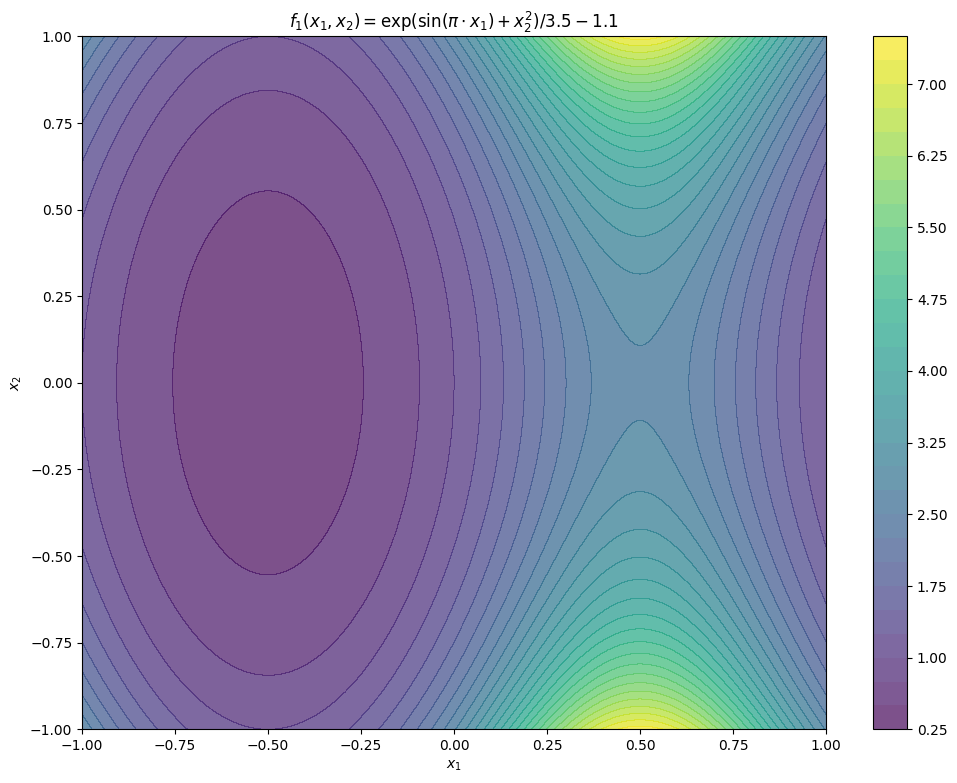

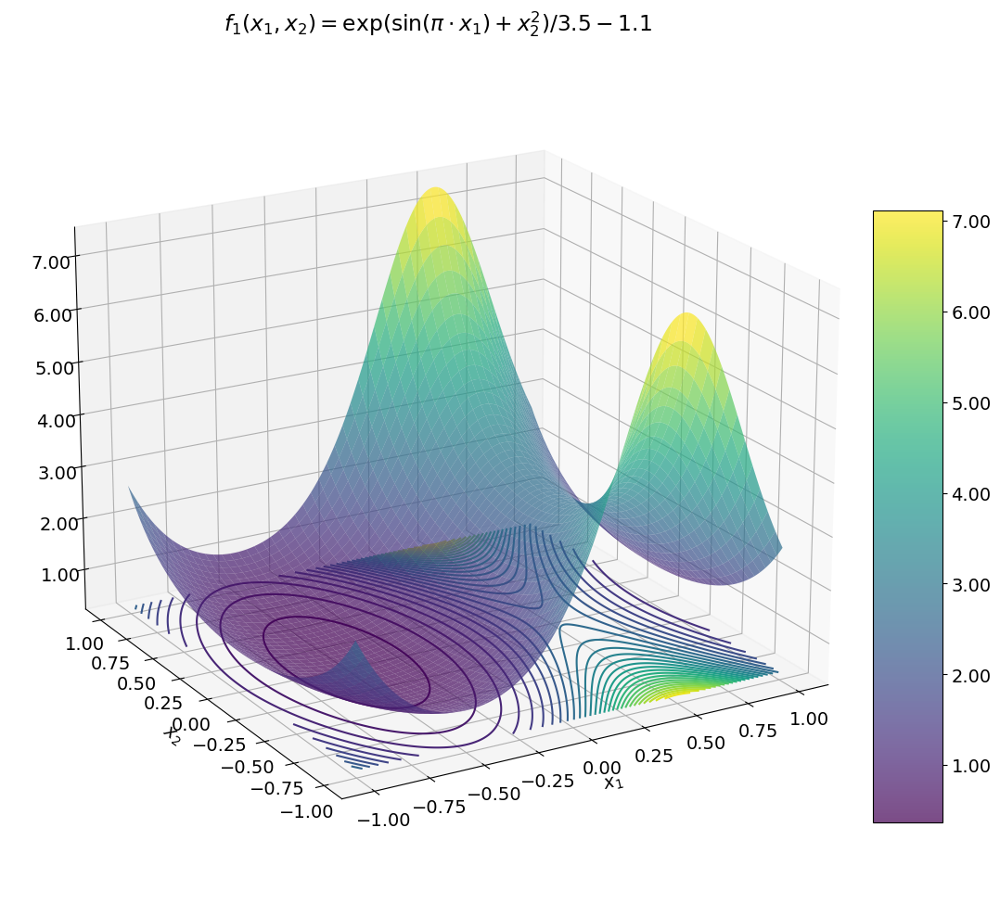

In [2]:
# create dataset
f1 = lambda x: torch.exp(torch.sin(torch.pi*x[:,[0]]) + x[:,[1]]**2)
dataset1 = create_dataset(f1, n_var=2, device=device)

f = f1
dataset = dataset1

plot_f_2d(f1, title='$f_1(x_1, x_2) = \exp(\sin(\pi \cdot x_1) +  x_2^2) / 3.5 - 1.1$')
plot_f_3d(f1, title='$f_1(x_1, x_2) = \exp(\sin(\pi \cdot x_1) +  x_2^2) / 3.5 - 1.1$')

-----
### MLP on $f_1$

№ model trainable params: 216


| train_loss: 2.18e-02 | test_loss: 2.91e-02 | reg: 1.07e+02 | : 100%|█| 100/100 [00:06<00:00, 14.70


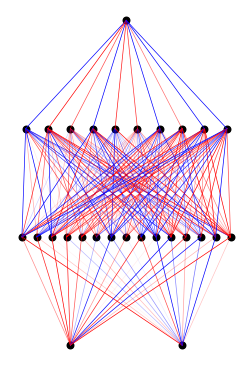

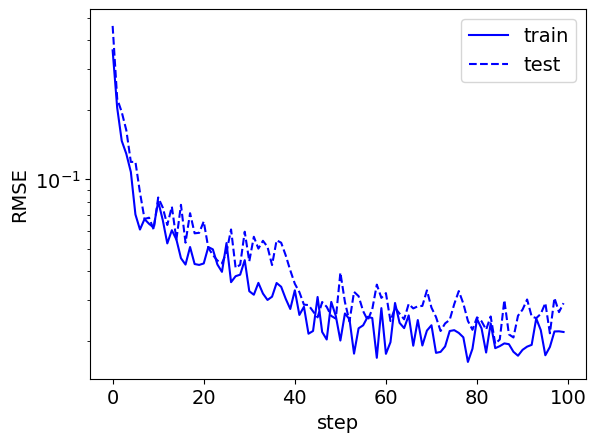

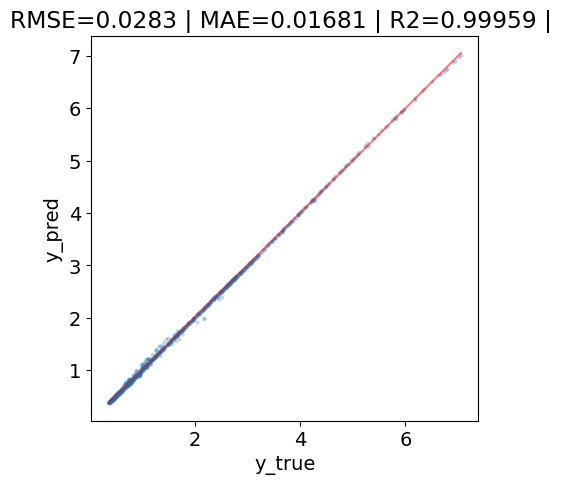

In [29]:
# initialize MLP
model = MLP(width=[2,15,10,1], seed=1, device=device)
pytorch_total_params = sum(p.numel() for p in model.parameters() if p.requires_grad) # trainable params

print(f'№ model trainable params: {pytorch_total_params}')

results = model.fit(dataset, steps=100, lamb = 0, batch=250)
kan_summary_after_fit(model, dataset, results)

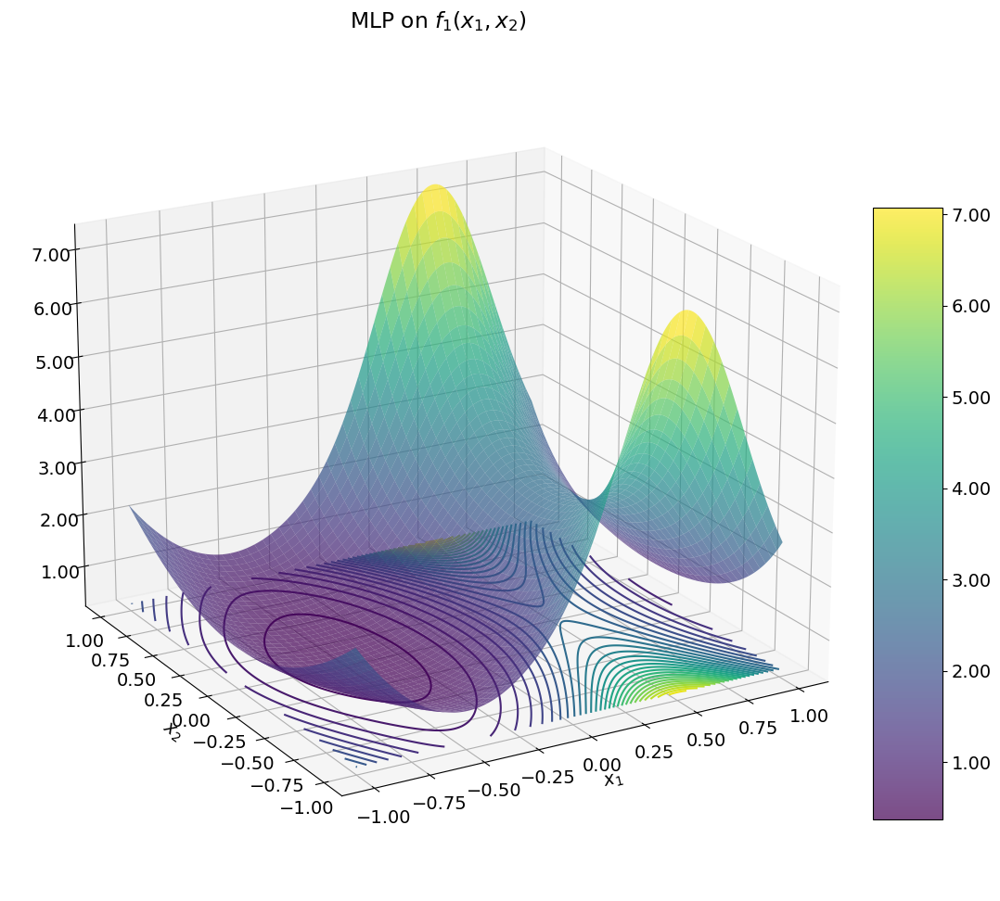

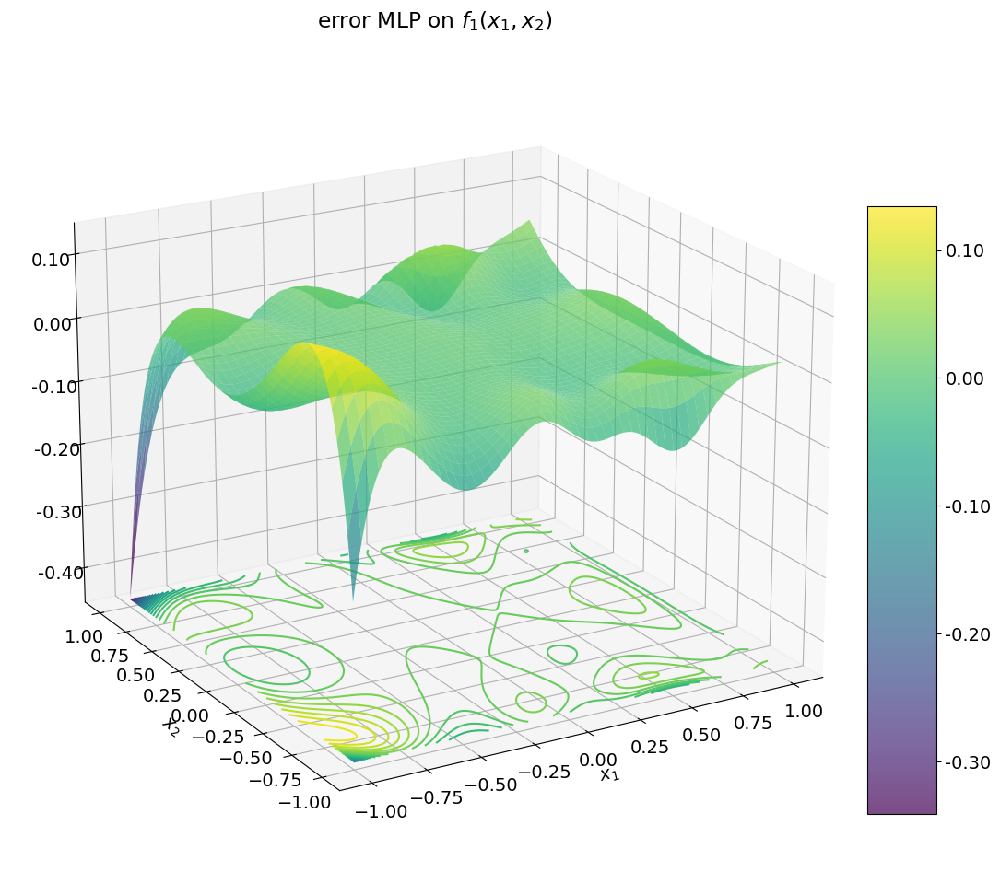

In [30]:
model_plot = lambda x: model(x).detach()
plot_f_3d(model_plot, title='MLP on $f_1(x_1, x_2)$')

error_model_plot = lambda x: model(x).detach() - f(x)
plot_f_3d(error_model_plot, title='error MLP on $f_1(x_1, x_2)$')

-----
### KAN on $f_1$

checkpoint directory created: ./model
saving model version 0.0
№ model trainable params: 180


| train_loss: 6.24e-03 | test_loss: 6.00e-03 | reg: 1.56e+01 | : 100%|█| 100/100 [00:43<00:00,  2.27


saving model version 0.1


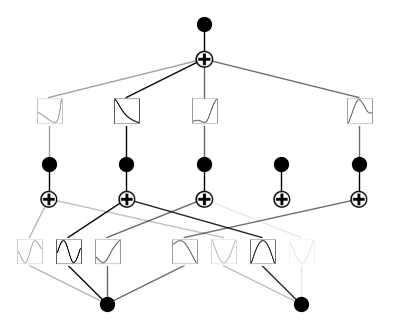

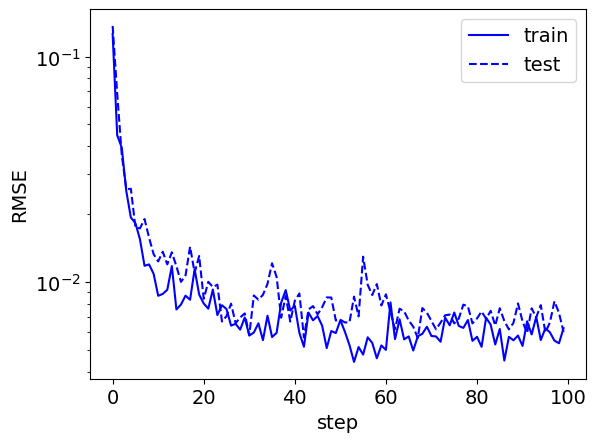

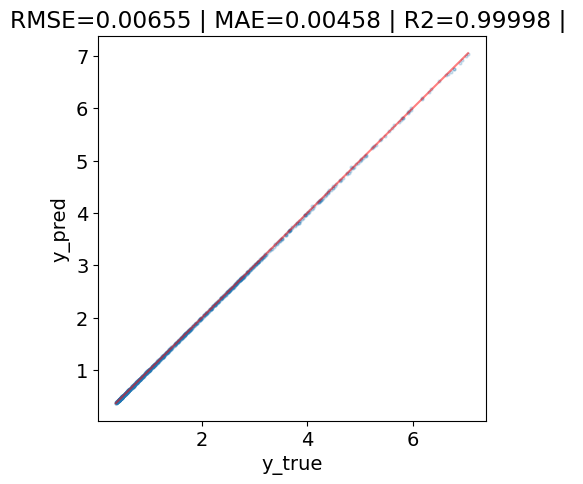

In [31]:
# initialize KAN with G=3
model = KAN(width=[2,5,1], grid=3, k=3, seed=1, device=device)
pytorch_total_params = sum(p.numel() for p in model.parameters() if p.requires_grad) # trainable params

print(f'№ model trainable params: {pytorch_total_params}')

results = model.fit(dataset, steps=100, lamb=1e-4, update_grid=False, batch=250)
kan_summary_after_fit(model, dataset, results)

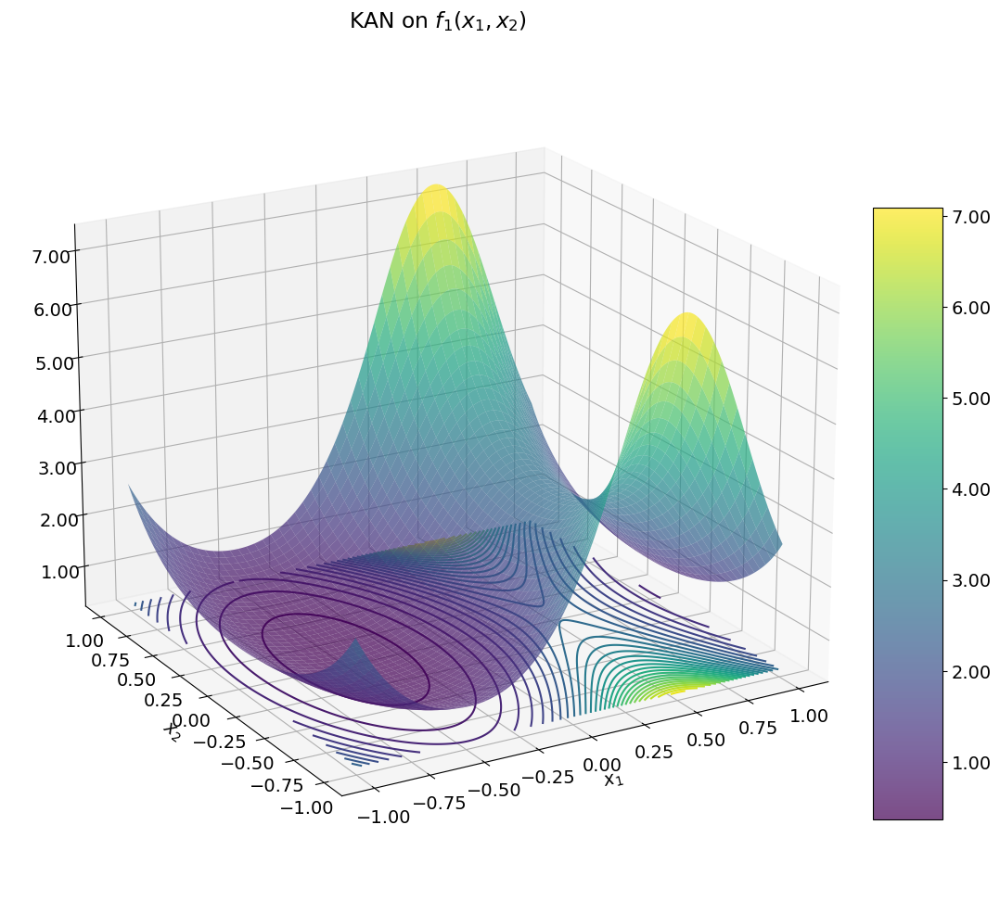

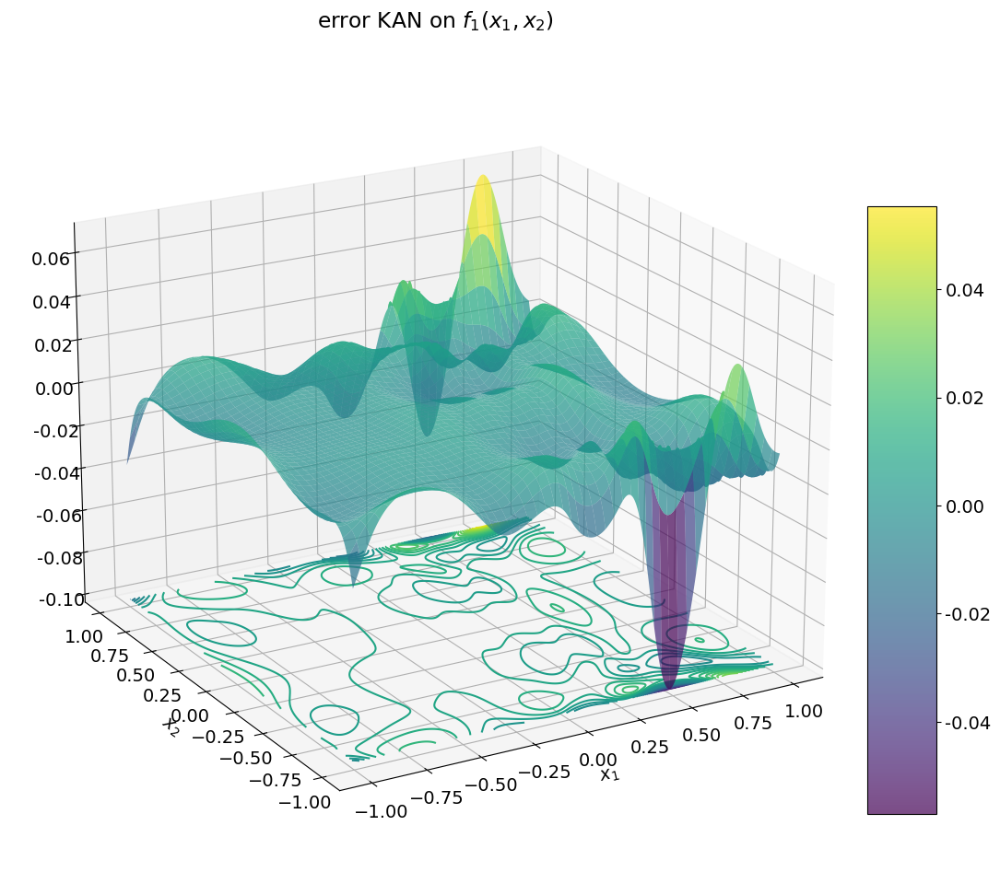

In [32]:
model_plot = lambda x: model(x).detach()
plot_f_3d(model_plot, title='KAN on $f_1(x_1, x_2)$')

error_model_plot = lambda x: model(x).detach() - f(x)
plot_f_3d(error_model_plot, title='error KAN on $f_1(x_1, x_2)$')

-----
### $\lambda$-KAN on $f_1$

checkpoint directory created: ./model
saving model version 0.0
№ model trainable params: 142


| train_loss: 2.45e-01 | test_loss: 2.71e-01 | reg: 2.92e+01 | : 100%|█| 150/150 [00:51<00:00,  2.89


saving model version 0.1


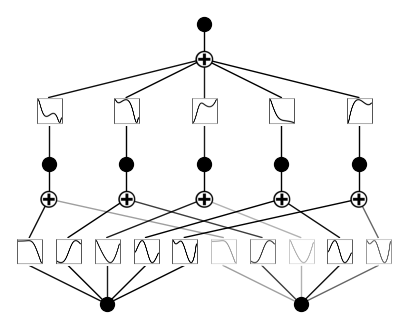

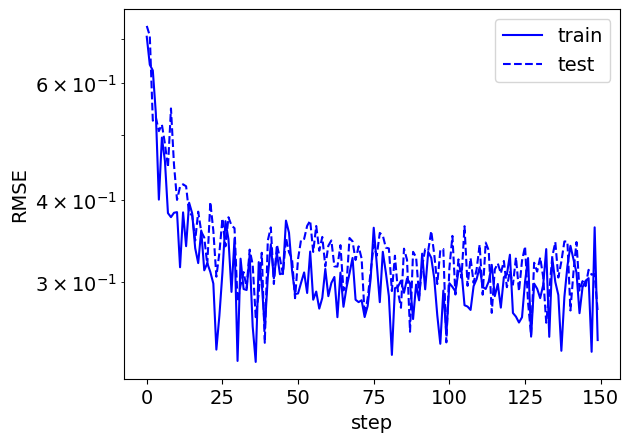

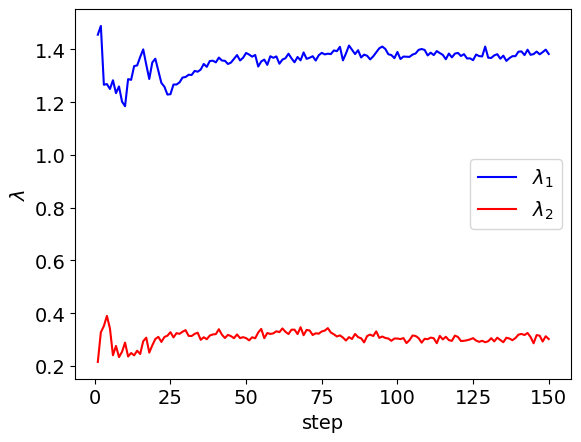

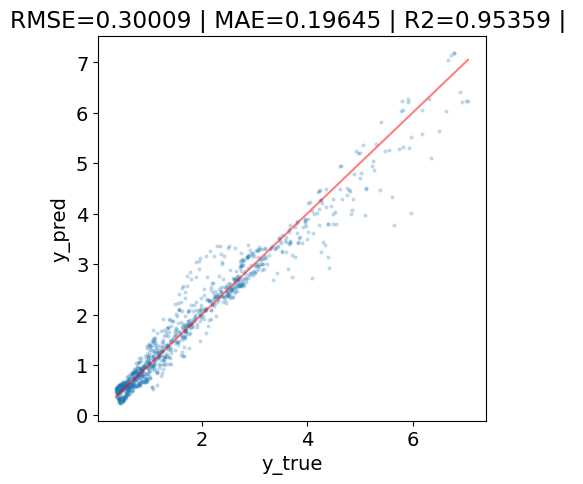

model.act_fun[0].lmd=Parameter containing:
tensor([1.3829, 0.3021], requires_grad=True)


In [3]:
# initialize lmdKAN with G=3
model = lmdKAN(width=[2,5,1], grid=3, k=3, seed=1, device=device)
pytorch_total_params = sum(p.numel() for p in model.parameters() if p.requires_grad) # trainable params

print(f'№ model trainable params: {pytorch_total_params}')

results = model.fit(dataset, steps=150, lamb = 1e-4, 
                    lamb_lmd_interm=0.0, lamb_lmd_final=0.0, reg_type='entropy',
                    batch=250)
kan_summary_after_fit(model, dataset, results, lmdKAN=True)
print(f'{model.act_fun[0].lmd=}')

ExactExplainer explainer: 1001it [00:21, 31.80it/s]                         


module of Input importance:


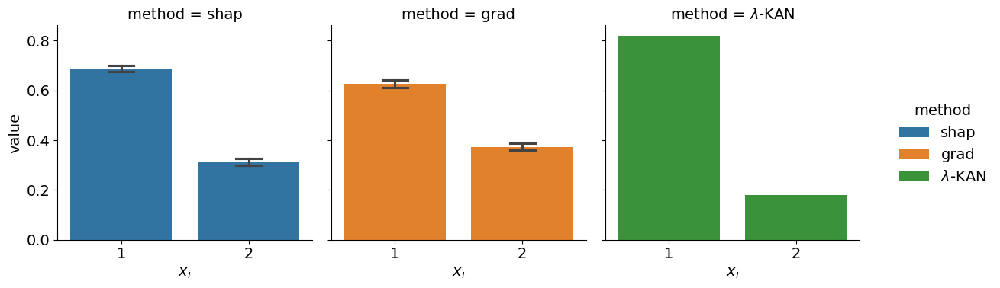

Input importance:


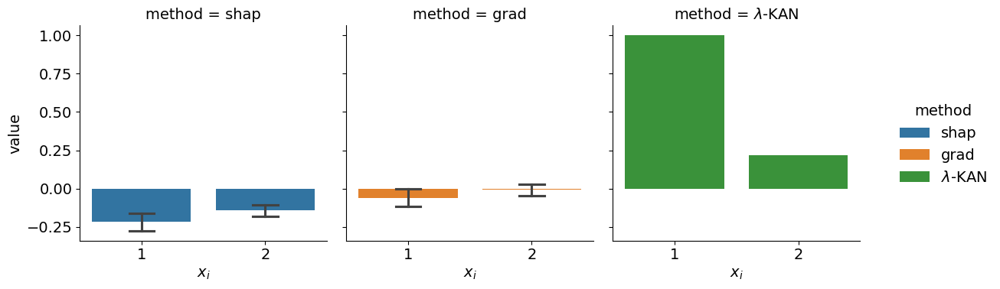

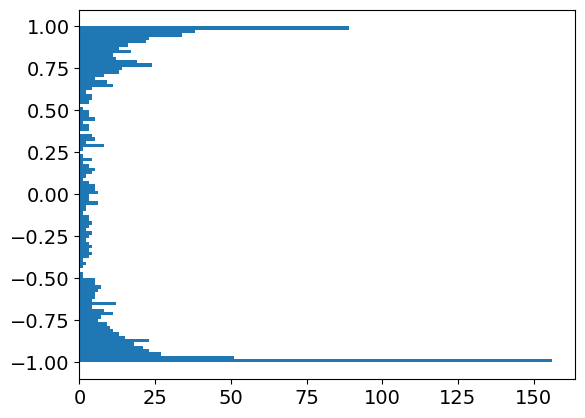

In [4]:
importance_analyse_lmdKAN(model, dataset)

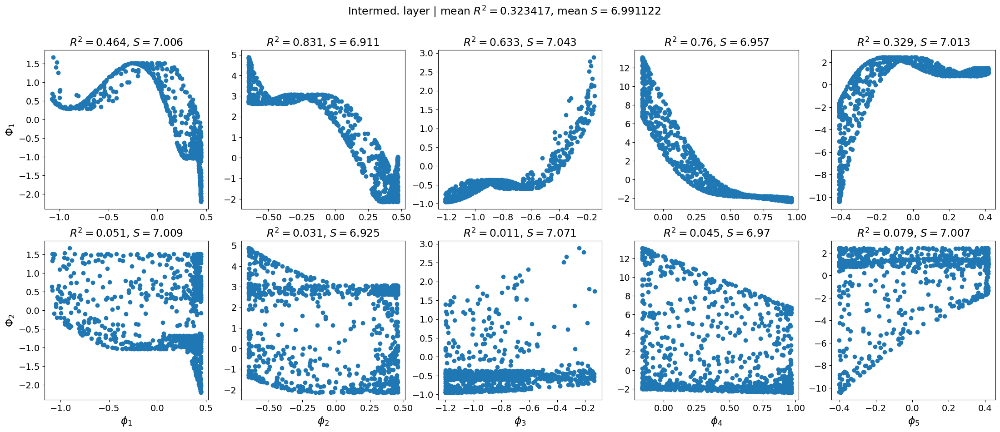

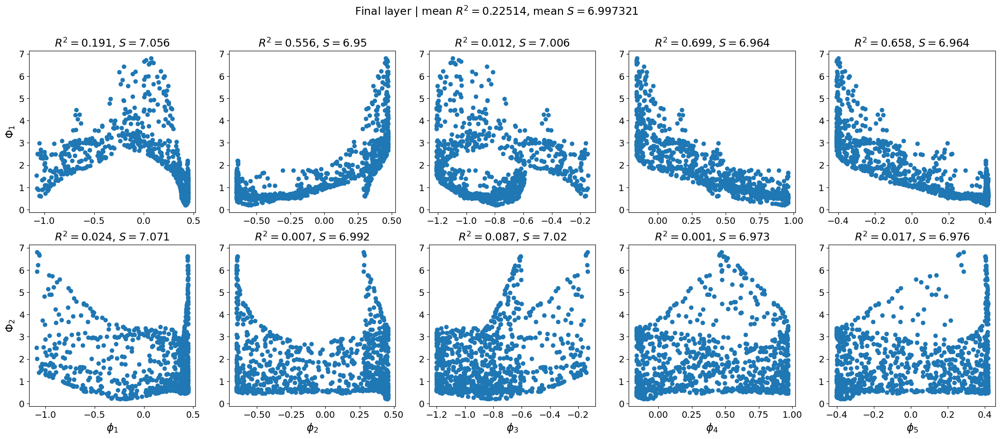

{'mean_r2': 0.22513977818889544, 'mean_matrix_entropy': 6.997320652008057}

In [57]:
model.lmd_corr_plot(title_text='Intermed. layer')
model.lmd_corr_plot(fin_layer=True, title_text='Final layer')

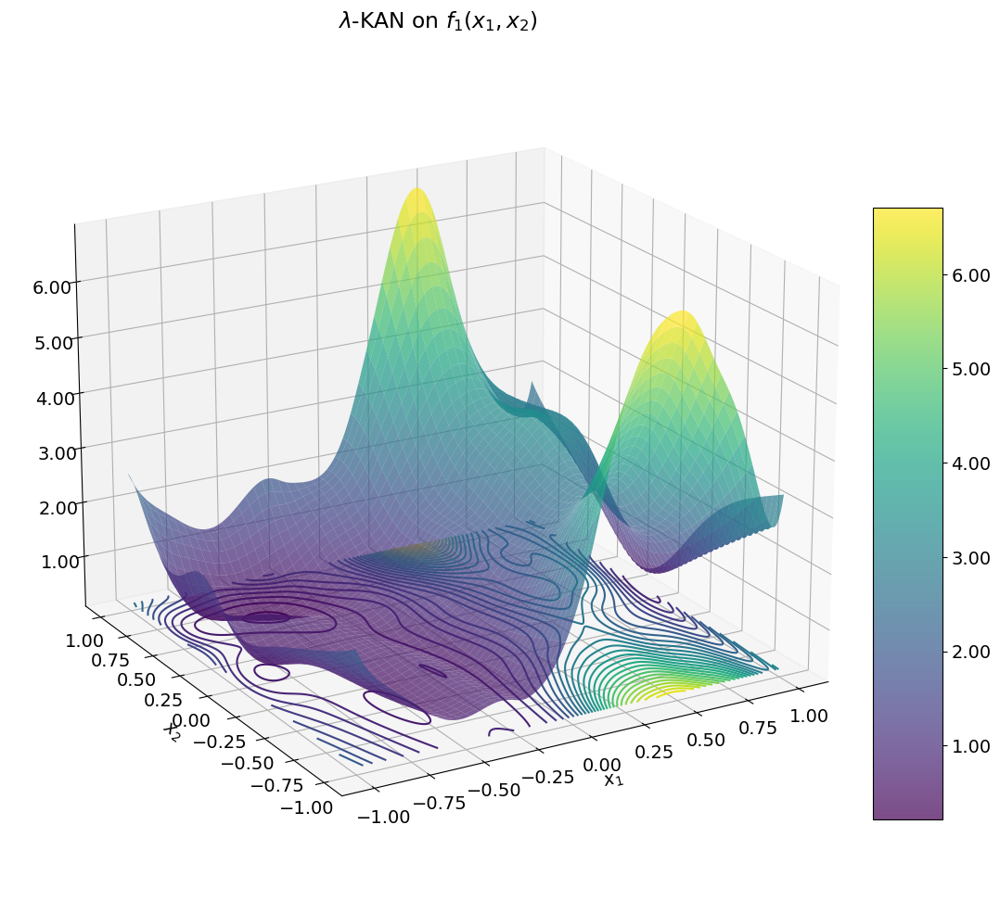

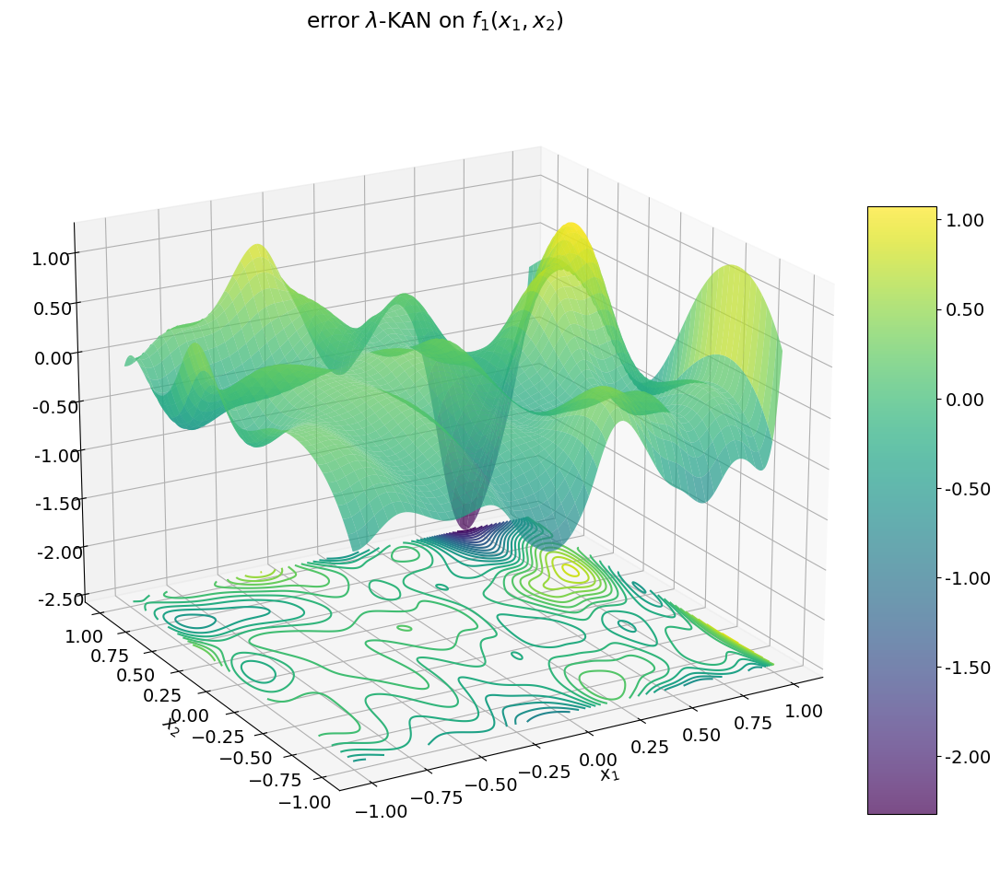

In [58]:
model_plot = lambda x: model(x).detach()
plot_f_3d(model_plot, title='$\lambda$-KAN on $f_1(x_1, x_2)$')

error_model_plot = lambda x: model(x).detach() - f(x)
plot_f_3d(error_model_plot, title='error $\lambda$-KAN on $f_1(x_1, x_2)$')

-----
-----
### $\lambda$-KAN on $f_1$ with __R2 regression__ in respect to __Interm. activations__

checkpoint directory created: ./model
saving model version 0.0
№ model trainable params: 142


description:   0%|                                                          | 0/150 [00:00<?, ?it/s]

| train_loss: 2.43e-01 | test_loss: 2.39e-01 | reg: 2.46e+01 | : 100%|█| 150/150 [02:04<00:00,  1.20


saving model version 0.1


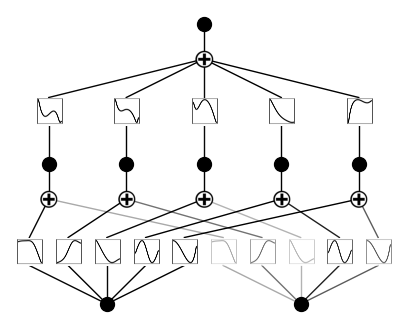

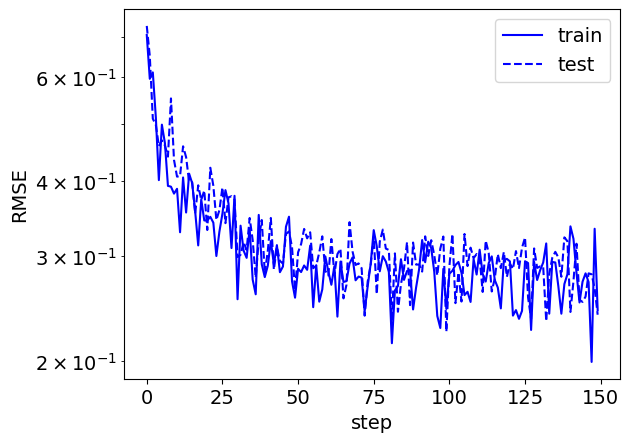

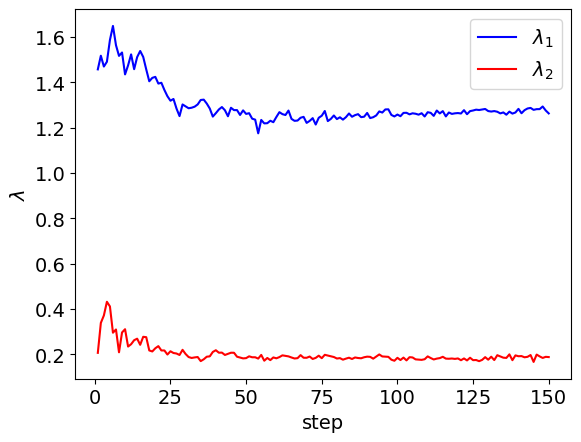

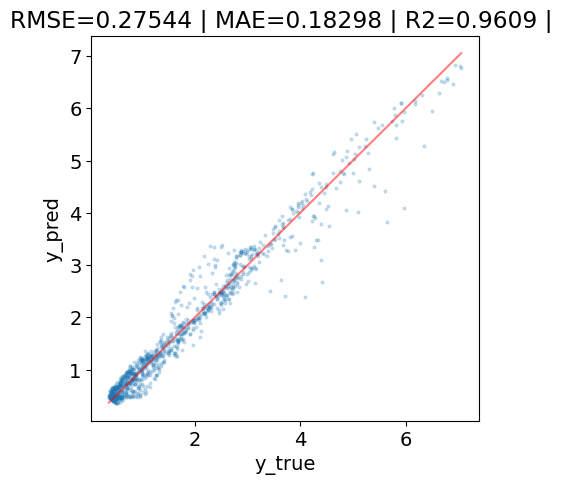

model.act_fun[0].lmd=Parameter containing:
tensor([1.2629, 0.1885], requires_grad=True)


In [36]:
# initialize lmdKAN with G=3
model = lmdKAN(width=[2,5,1], grid=3, k=3, seed=1, device=device)
pytorch_total_params = sum(p.numel() for p in model.parameters() if p.requires_grad) # trainable params

print(f'№ model trainable params: {pytorch_total_params}')

results = model.fit(dataset, steps=150, lamb = 1e-4, 
                    lamb_lmd_interm=1.0, lamb_lmd_final=0.0, reg_type='r2',
                    batch=250)

kan_summary_after_fit(model, dataset, results, lmdKAN=True)

model.forward(dataset['test_input'])

print(f'{model.act_fun[0].lmd=}')

ExactExplainer explainer: 1001it [00:24, 26.18it/s]                         


module of Input importance:


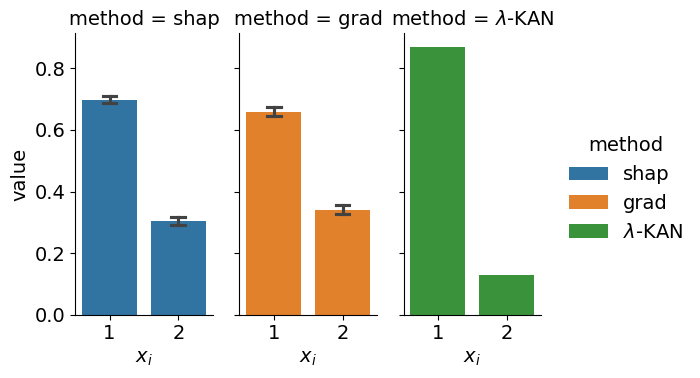

Input importance:


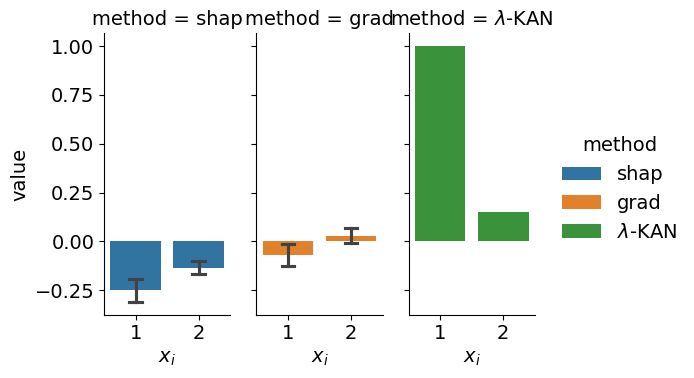

In [37]:
importance_analyse_lmdKAN(model, dataset)

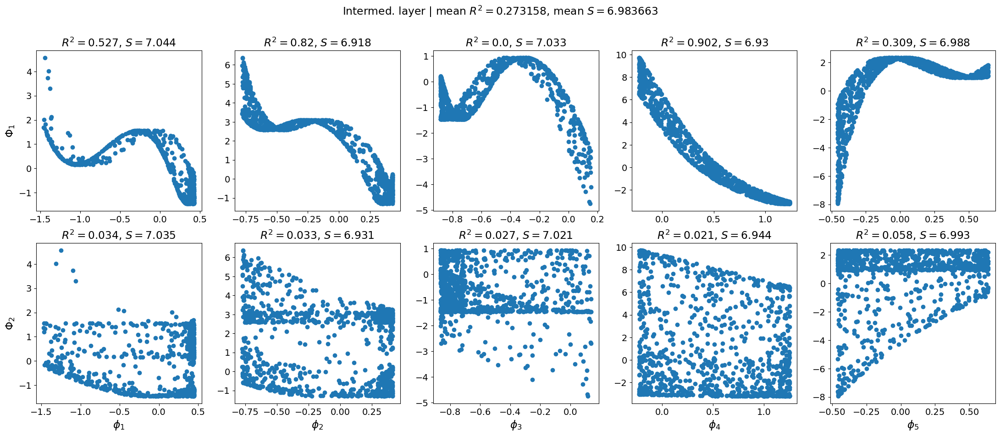

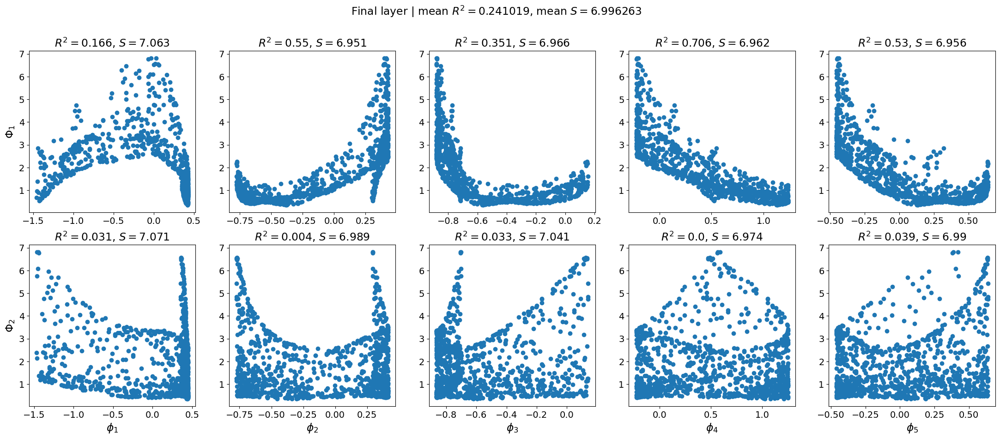

{'mean_r2': 0.24101947316521546, 'mean_matrix_entropy': 6.996262550354004}

In [38]:
model.lmd_corr_plot(title_text='Intermed. layer')
model.lmd_corr_plot(fin_layer=True, title_text='Final layer')

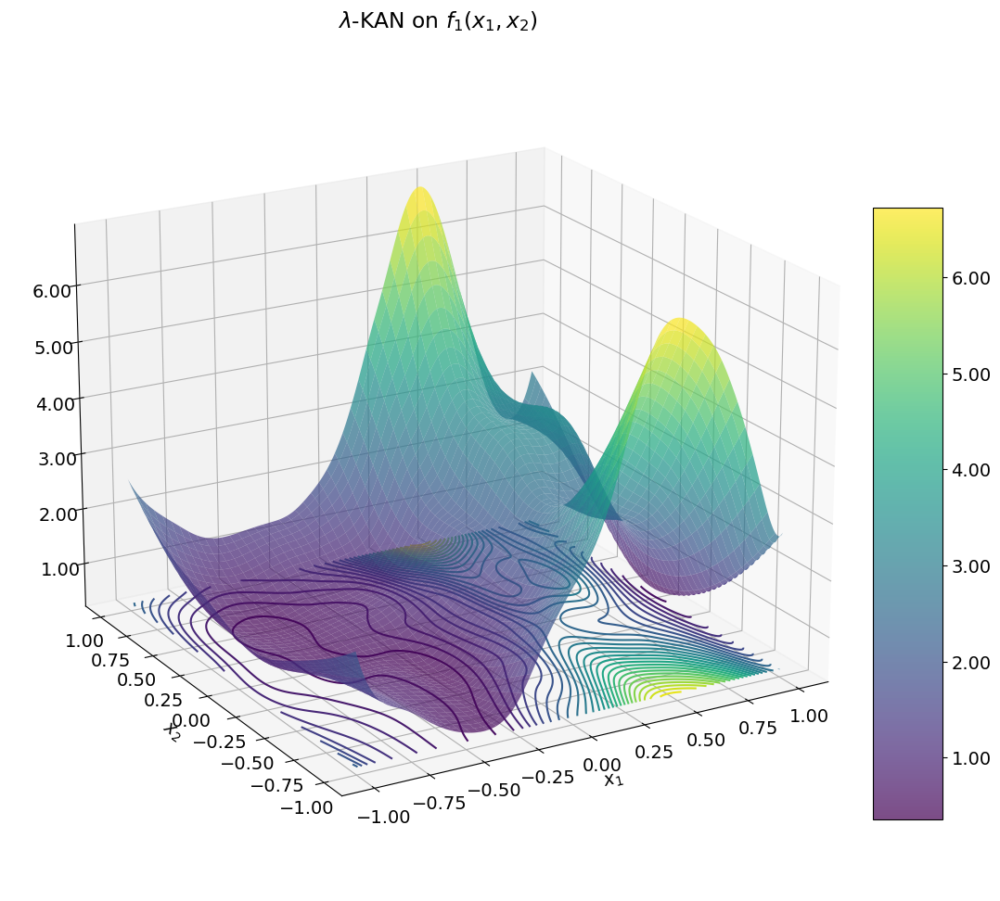

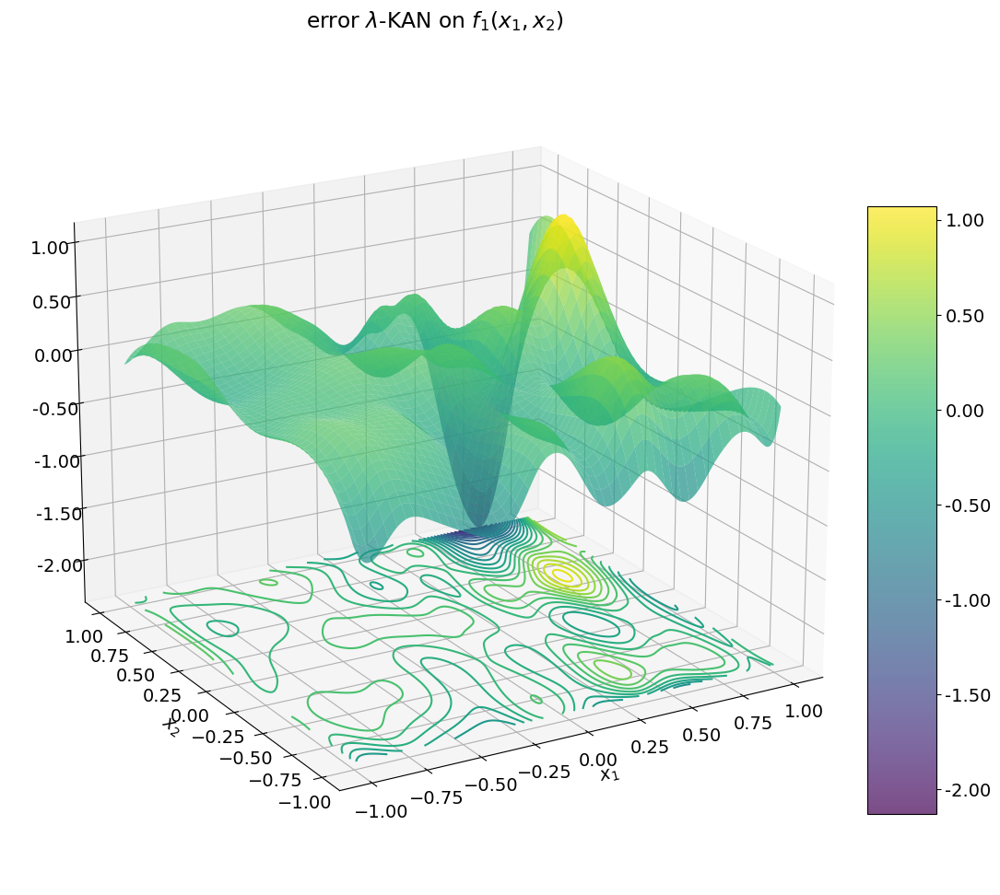

In [39]:
model_plot = lambda x: model(x).detach()
plot_f_3d(model_plot, title='$\lambda$-KAN on $f_1(x_1, x_2)$')

error_model_plot = lambda x: model(x).detach() - f(x)
plot_f_3d(error_model_plot, title='error $\lambda$-KAN on $f_1(x_1, x_2)$')

-----
### $\lambda$-KAN on $f_1$ with __Entropy regression__ in respect to __Interm. activations__

checkpoint directory created: ./model
saving model version 0.0
№ model trainable params: 142


description:   0%|                                                          | 0/150 [00:00<?, ?it/s]

| train_loss: 2.45e-01 | test_loss: 2.38e-01 | reg: 2.78e+01 | : 100%|█| 150/150 [02:05<00:00,  1.20


saving model version 0.1


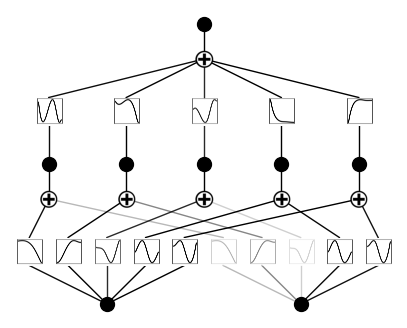

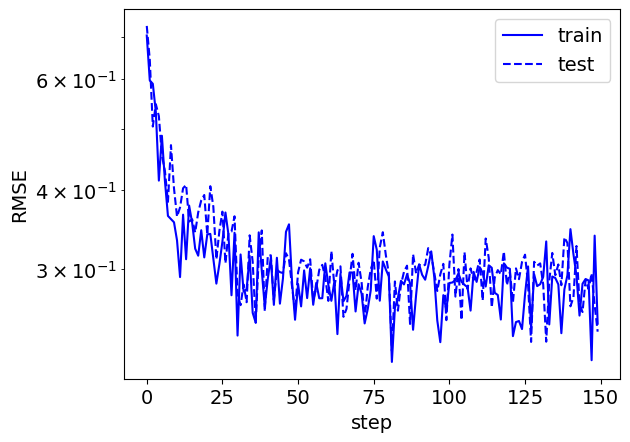

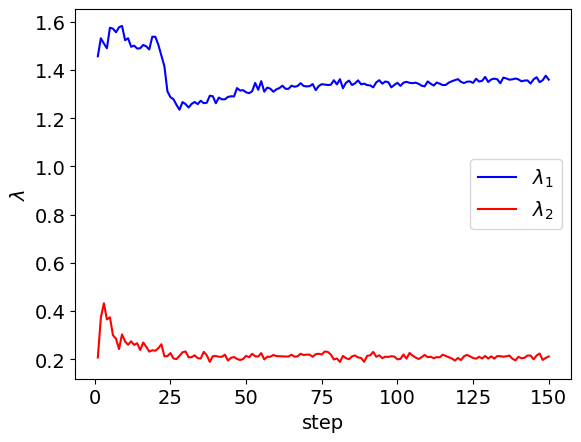

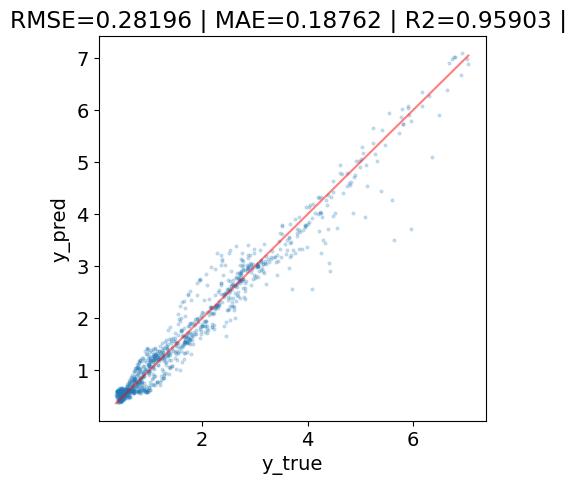

model.act_fun[0].lmd=Parameter containing:
tensor([1.3602, 0.2115], requires_grad=True)


In [42]:
# initialize lmdKAN with G=3
model = lmdKAN(width=[2,5,1], grid=3, k=3, seed=1, device=device)
pytorch_total_params = sum(p.numel() for p in model.parameters() if p.requires_grad) # trainable params

print(f'№ model trainable params: {pytorch_total_params}')

results = model.fit(dataset, steps=150, lamb = 1e-4, 
                    lamb_lmd_interm=1.0, lamb_lmd_final=0.0, reg_type='entropy',
                    batch=250)

kan_summary_after_fit(model, dataset, results, lmdKAN=True)

model.forward(dataset['test_input'])

print(f'{model.act_fun[0].lmd=}')

ExactExplainer explainer: 1001it [00:22, 22.19it/s]                         


module of Input importance:


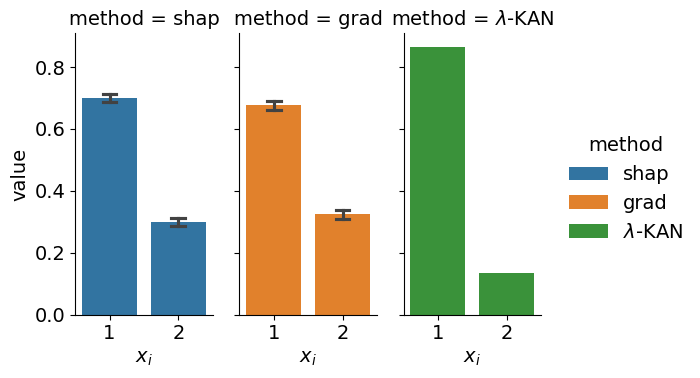

Input importance:


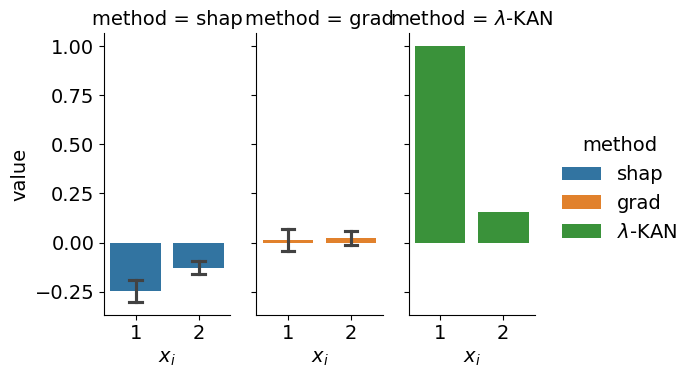

In [43]:
importance_analyse_lmdKAN(model, dataset)

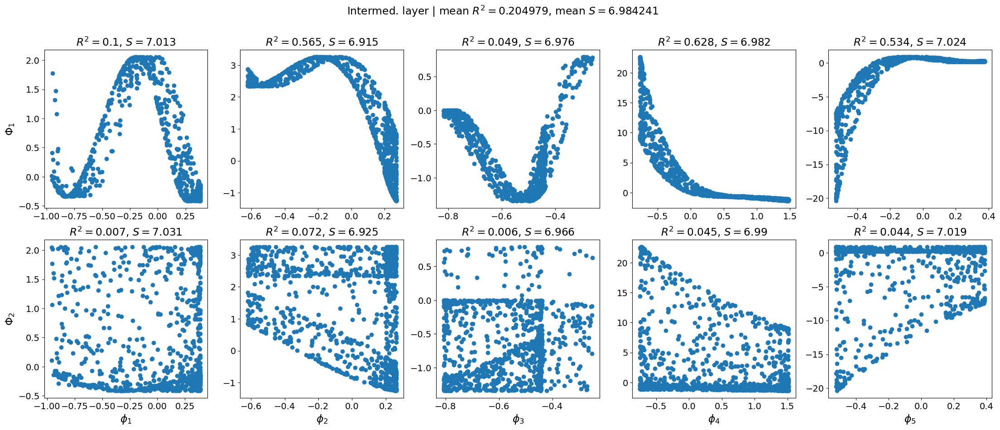

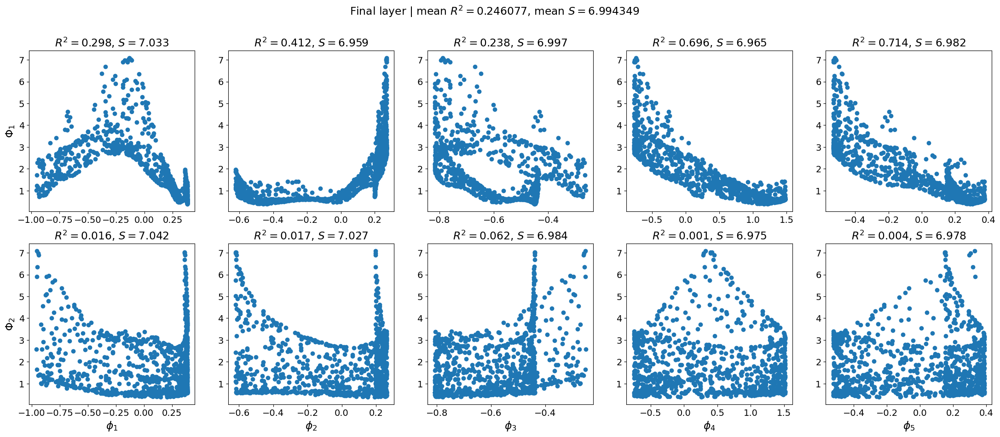

{'mean_r2': 0.24607705560629256, 'mean_matrix_entropy': 6.994349002838135}

In [44]:
model.lmd_corr_plot(title_text='Intermed. layer')
model.lmd_corr_plot(fin_layer=True, title_text='Final layer')

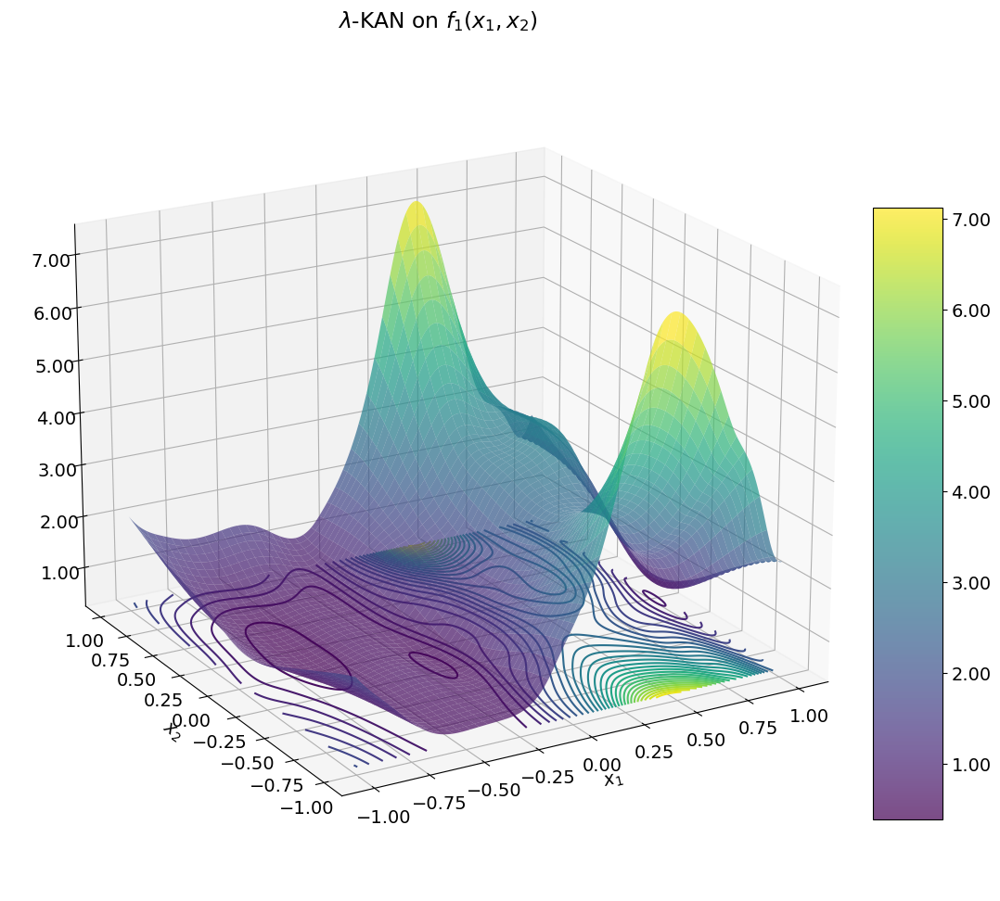

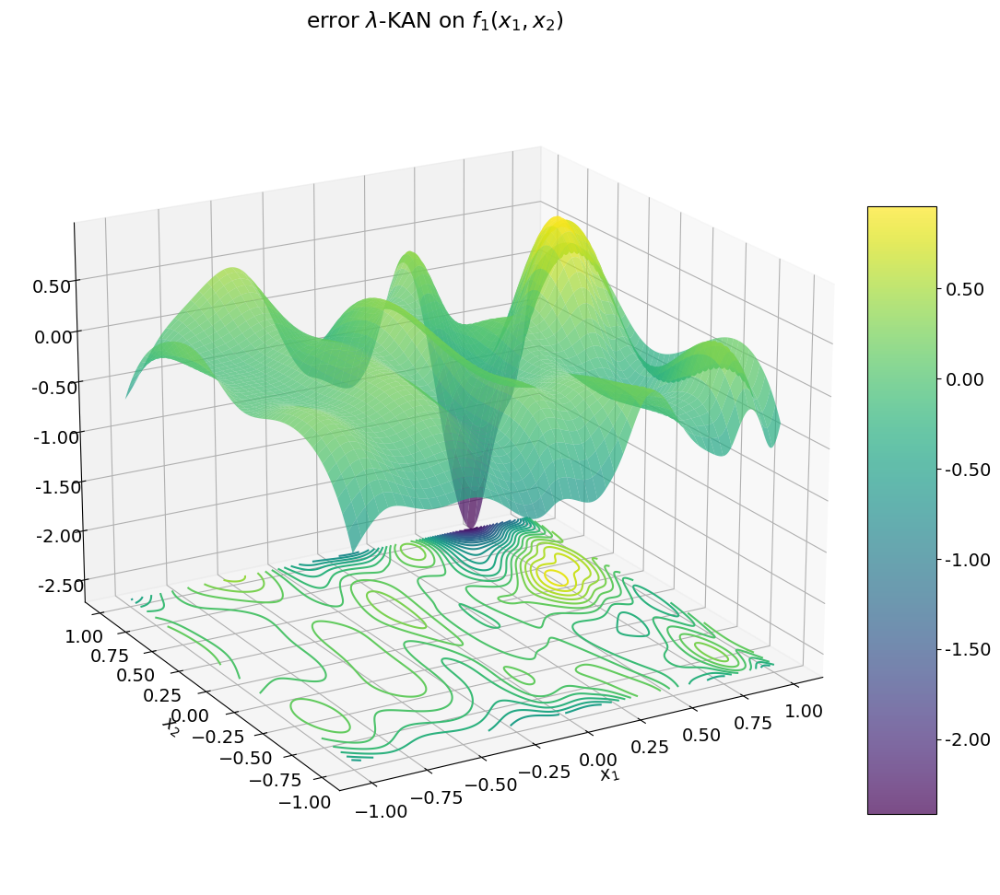

In [45]:
model_plot = lambda x: model(x).detach()
plot_f_3d(model_plot, title='$\lambda$-KAN on $f_1(x_1, x_2)$')

error_model_plot = lambda x: model(x).detach() - f(x)
plot_f_3d(error_model_plot, title='error $\lambda$-KAN on $f_1(x_1, x_2)$')

-----
-----
### $\lambda$-KAN on $f_1$ with __R2 regression__ in respect to __Final activations__

checkpoint directory created: ./model
saving model version 0.0
№ model trainable params: 142


description:   0%|                                                          | 0/150 [00:00<?, ?it/s]

| train_loss: 2.39e-01 | test_loss: 2.46e-01 | reg: 2.00e+01 | : 100%|█| 150/150 [01:16<00:00,  1.96


saving model version 0.1


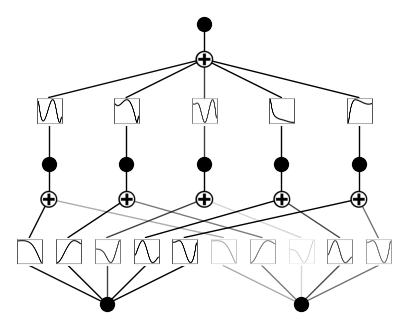

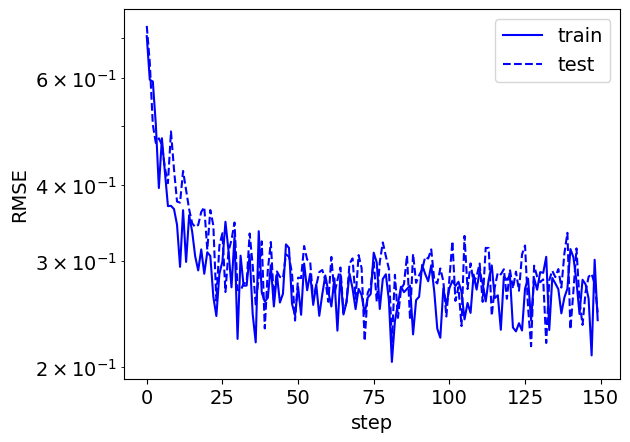

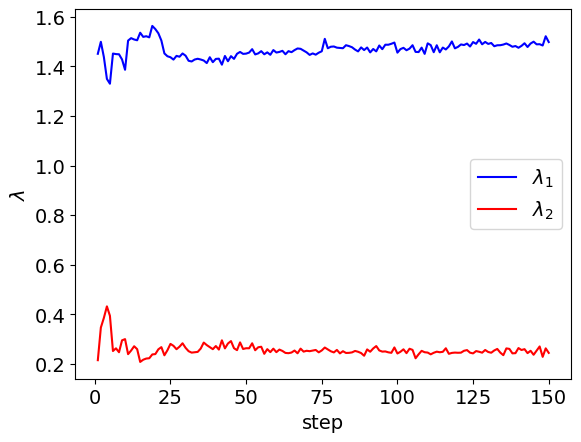

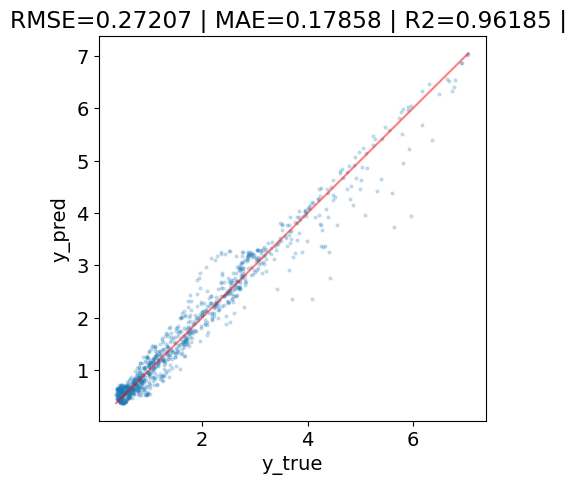

model.act_fun[0].lmd=Parameter containing:
tensor([1.4980, 0.2441], requires_grad=True)


In [47]:
# initialize lmdKAN with G=3
model = lmdKAN(width=[2,5,1], grid=3, k=3, seed=1, device=device)
pytorch_total_params = sum(p.numel() for p in model.parameters() if p.requires_grad) # trainable params

print(f'№ model trainable params: {pytorch_total_params}')

results = model.fit(dataset, steps=150, lamb = 1e-4, 
                    lamb_lmd_interm=0.0, lamb_lmd_final=1.0, reg_type='r2',
                    batch=250)

kan_summary_after_fit(model, dataset, results, lmdKAN=True)

model.forward(dataset['test_input'])

print(f'{model.act_fun[0].lmd=}')

ExactExplainer explainer: 1001it [00:15, 24.51it/s]                         


module of Input importance:


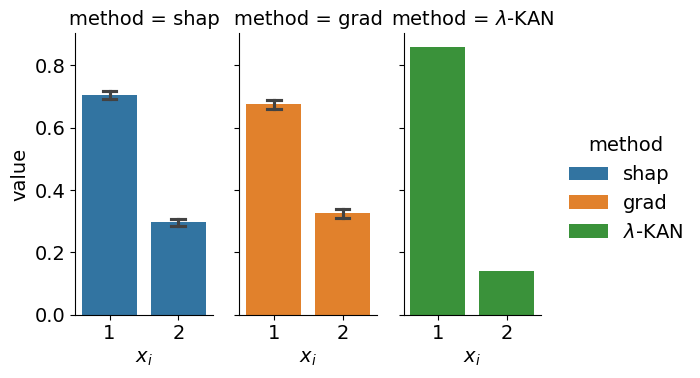

Input importance:


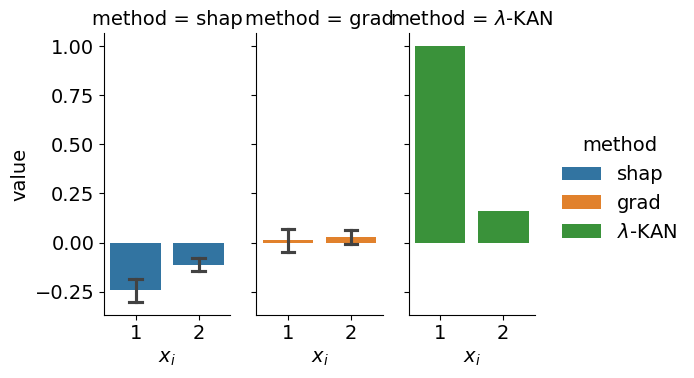

In [48]:
importance_analyse_lmdKAN(model, dataset)

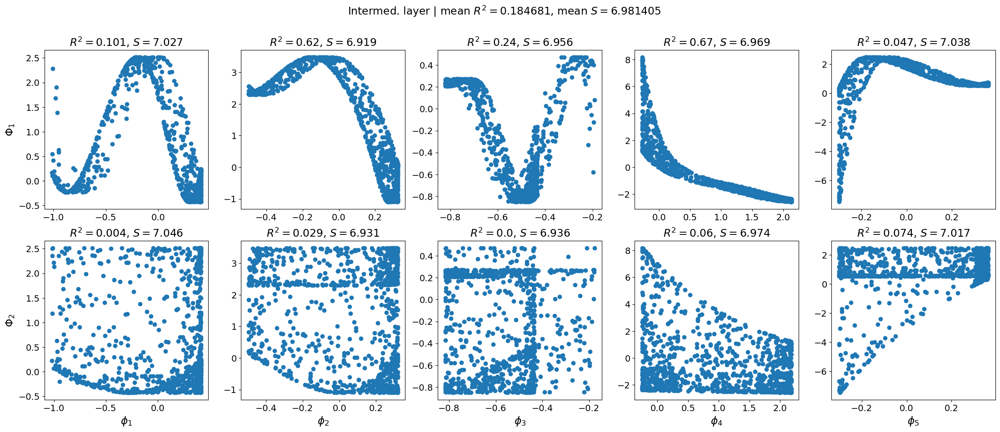

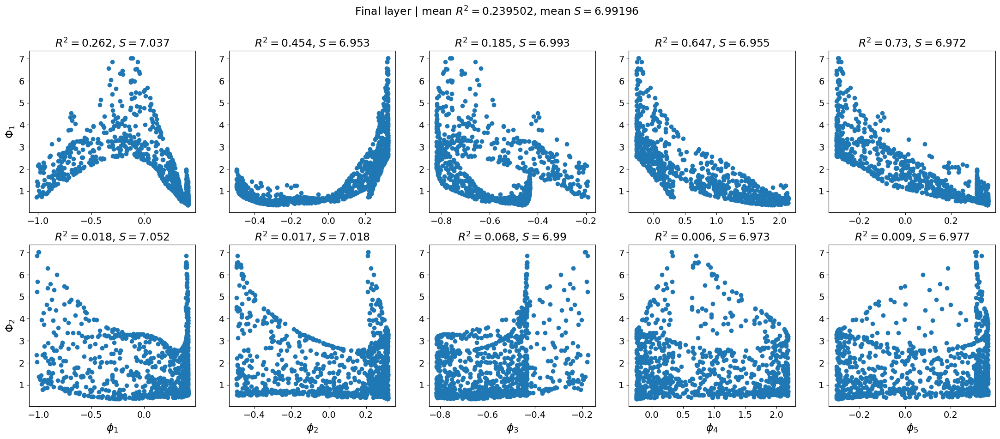

{'mean_r2': 0.23950189701281488, 'mean_matrix_entropy': 6.991959571838379}

In [49]:
model.lmd_corr_plot(title_text='Intermed. layer')
model.lmd_corr_plot(fin_layer=True, title_text='Final layer')

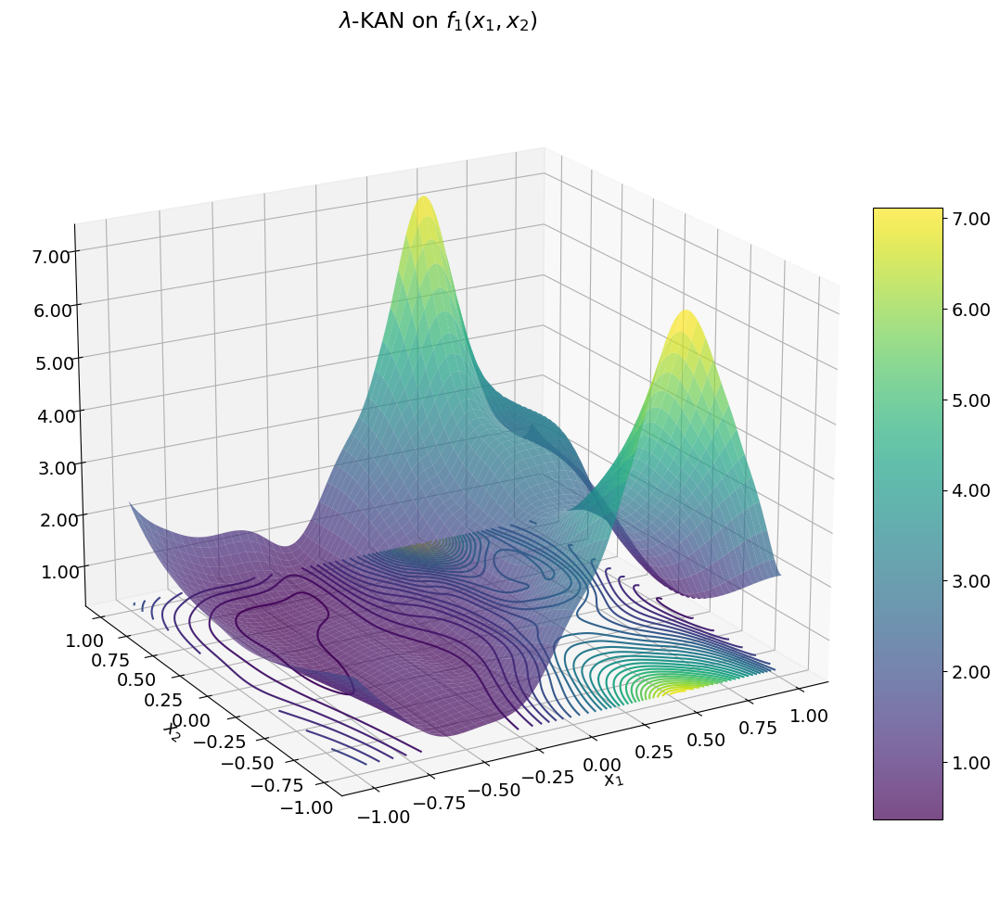

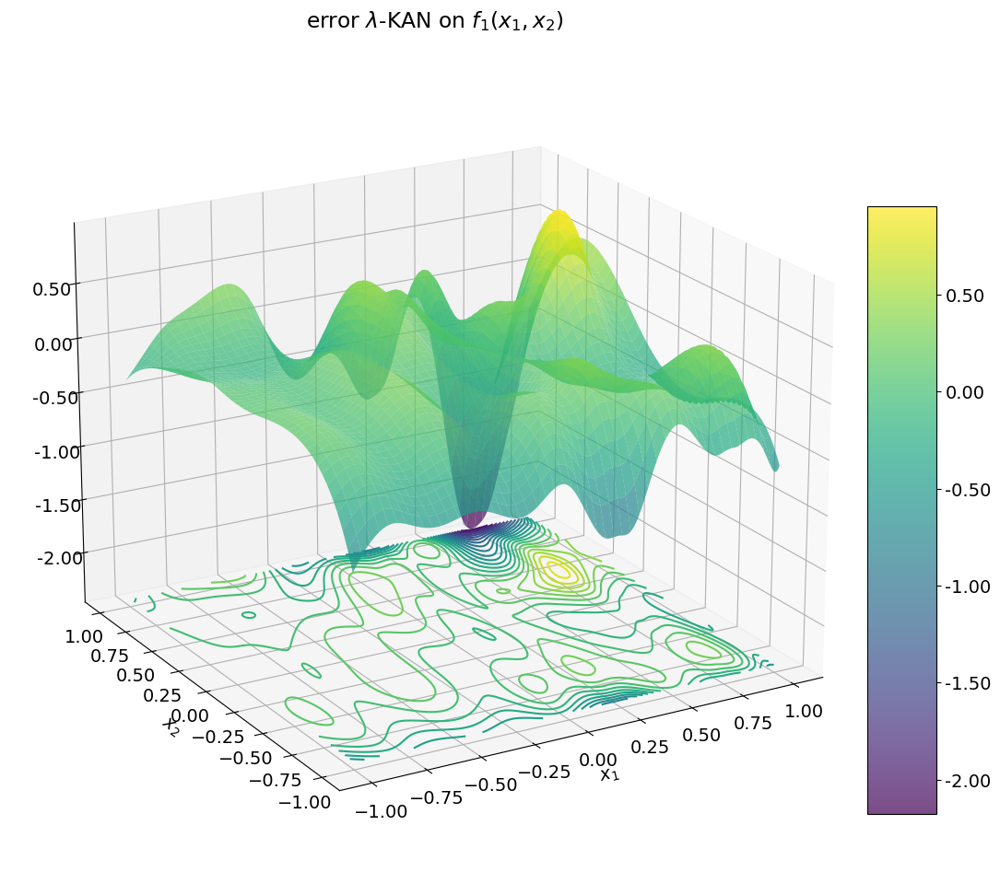

In [50]:
model_plot = lambda x: model(x).detach()
plot_f_3d(model_plot, title='$\lambda$-KAN on $f_1(x_1, x_2)$')

error_model_plot = lambda x: model(x).detach() - f(x)
plot_f_3d(error_model_plot, title='error $\lambda$-KAN on $f_1(x_1, x_2)$')

-----
### $\lambda$-KAN on $f_1$ with __Entropy regression__ in respect to __Final activations__

checkpoint directory created: ./model
saving model version 0.0
№ model trainable params: 142


| train_loss: 2.71e-01 | test_loss: 2.78e-01 | reg: 2.36e+01 | : 100%|█| 150/150 [01:47<00:00,  1.39


saving model version 0.1


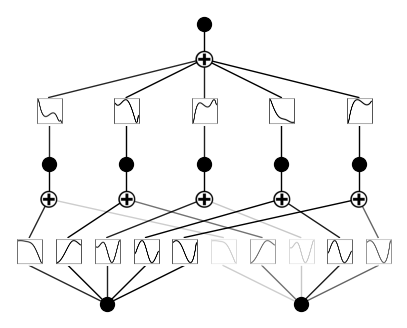

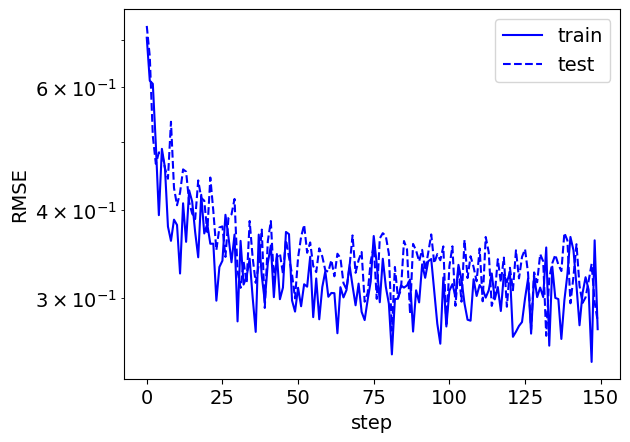

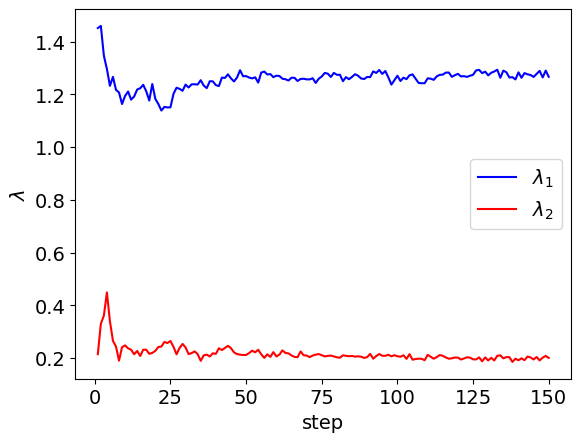

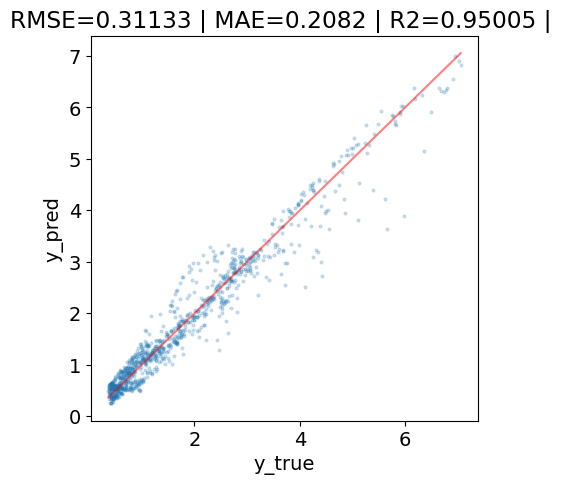

model.act_fun[0].lmd=Parameter containing:
tensor([1.2662, 0.2006], requires_grad=True)


In [51]:
# initialize lmdKAN with G=3
model = lmdKAN(width=[2,5,1], grid=3, k=3, seed=1, device=device)
pytorch_total_params = sum(p.numel() for p in model.parameters() if p.requires_grad) # trainable params

print(f'№ model trainable params: {pytorch_total_params}')

results = model.fit(dataset, steps=150, lamb = 1e-4, 
                    lamb_lmd_interm=0.0, lamb_lmd_final=1.0, reg_type='entropy',
                    batch=250)

kan_summary_after_fit(model, dataset, results, lmdKAN=True)

model.forward(dataset['test_input'])

print(f'{model.act_fun[0].lmd=}')

ExactExplainer explainer: 1001it [00:21, 22.35it/s]                         


module of Input importance:


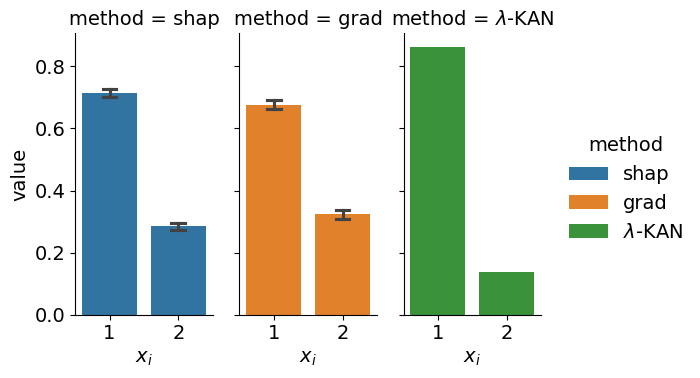

Input importance:


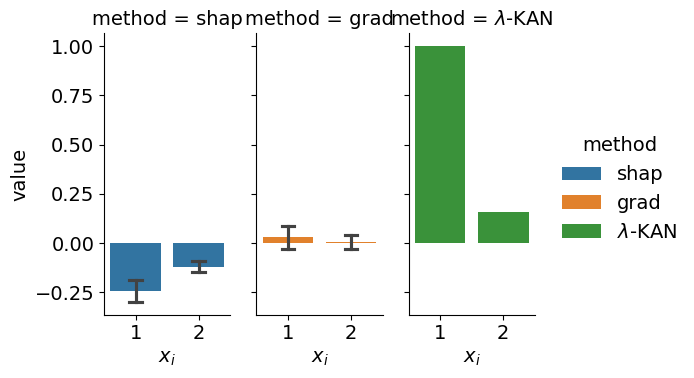

In [52]:
importance_analyse_lmdKAN(model, dataset)

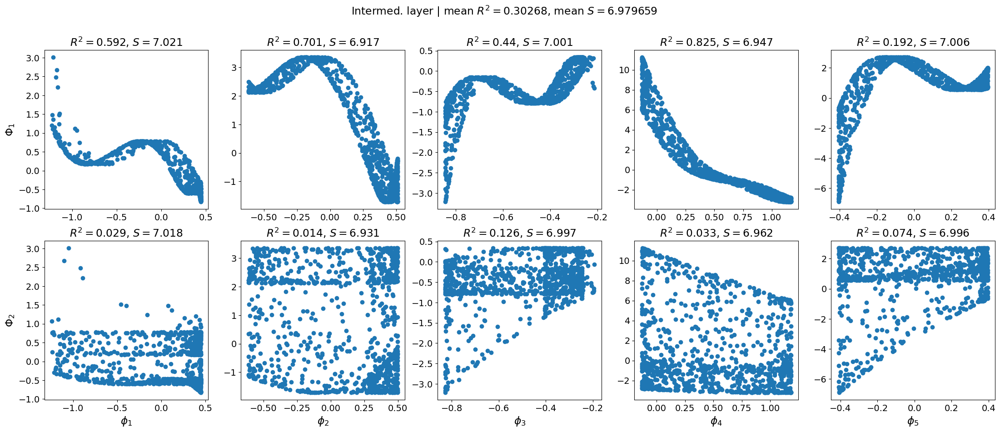

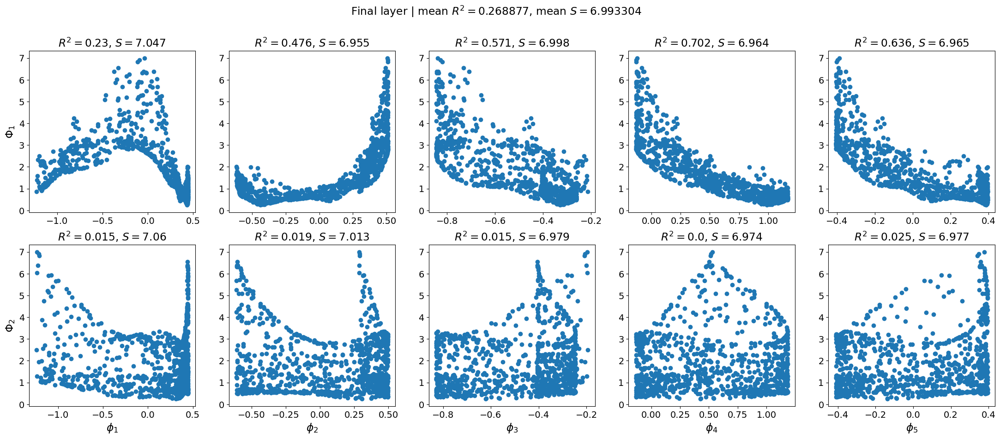

{'mean_r2': 0.26887705613376767, 'mean_matrix_entropy': 6.993304252624512}

In [53]:
model.lmd_corr_plot(title_text='Intermed. layer')
model.lmd_corr_plot(fin_layer=True, title_text='Final layer')

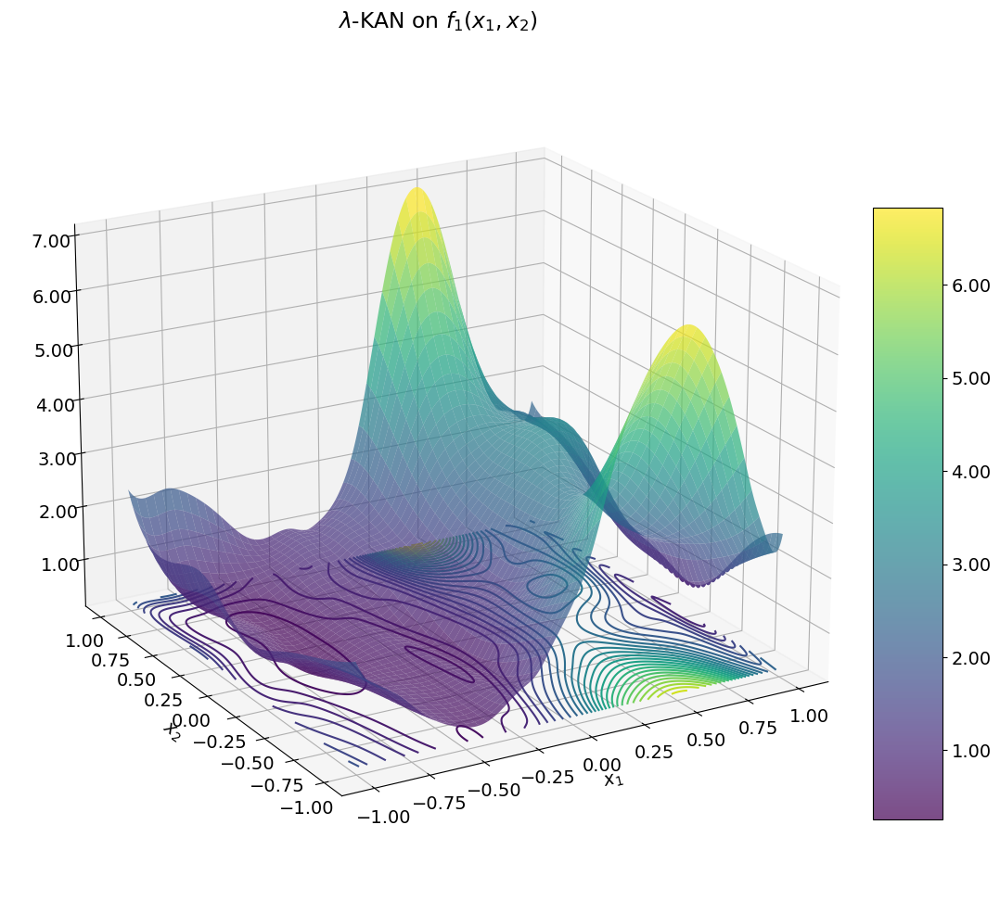

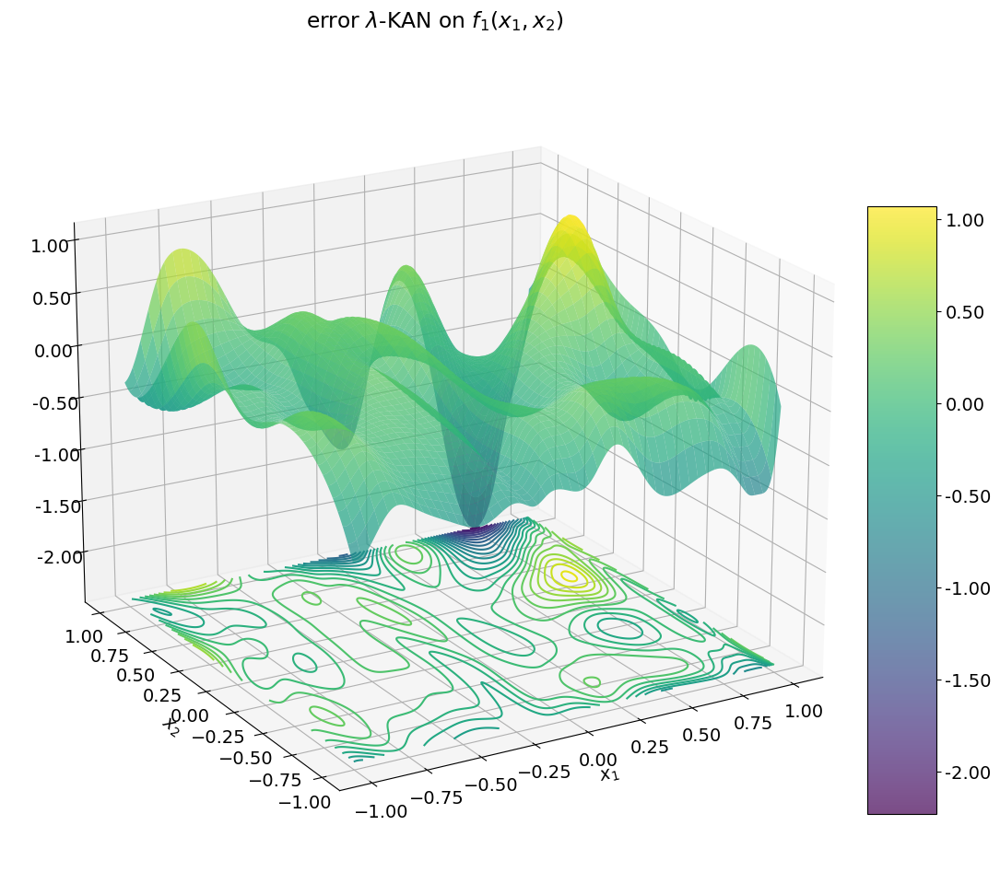

In [54]:
model_plot = lambda x: model(x).detach()
plot_f_3d(model_plot, title='$\lambda$-KAN on $f_1(x_1, x_2)$')

error_model_plot = lambda x: model(x).detach() - f(x)
plot_f_3d(error_model_plot, title='error $\lambda$-KAN on $f_1(x_1, x_2)$')